In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, classification_report
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Embedding, GlobalAveragePooling1D, Dropout, Dense
from tensorflow.keras.preprocessing import sequence

from TransformerComplet import *

from tensorflow.keras.layers import Dense, Dropout, Embedding, Input, Concatenate, MultiHeadAttention


In [11]:

# 1. Prétraitement des Données
benign_stateful_1 = pd.read_csv('../../data/Attack_Benin_2/Benign/Benign/stateful_features-benign_heavy_1.pcap.csv')
benign_stateful_2 = pd.read_csv('../../data/Attack_Benin_2/Benign/Benign/stateful_features-benign_heavy_2.pcap.csv')
benign_stateful_3 = pd.read_csv('../../data/Attack_Benin_2/Benign/Benign/stateful_features-benign_heavy_3.pcap.csv')

benign_stateless_1 = pd.read_csv('../../data/Attack_Benin_2/Benign/Benign/stateless_features-benign_heavy_1.pcap.csv')
benign_stateless_2 = pd.read_csv('../../data/Attack_Benin_2/Benign/Benign/stateless_features-benign_heavy_2.pcap.csv')
benign_stateless_3 = pd.read_csv('../../data/Attack_Benin_2/Benign/Benign/stateless_features-benign_heavy_3.pcap.csv')

attack_stateful_1 = pd.read_csv('../../data/Attack_Benin_2/Attacks/Attacks/stateful_features-heavy_audio.pcap.csv')
attack_stateful_2 = pd.read_csv('../../data/Attack_Benin_2/Attacks/Attacks/stateful_features-heavy_compressed.pcap.csv')
attack_stateful_3 = pd.read_csv('../../data/Attack_Benin_2/Attacks/Attacks/stateful_features-heavy_exe.pcap.csv')
attack_stateful_4 = pd.read_csv('../../data/Attack_Benin_2/Attacks/Attacks/stateful_features-heavy_image.pcap.csv')
attack_stateful_5 = pd.read_csv('../../data/Attack_Benin_2/Attacks/Attacks/stateful_features-heavy_text.pcap.csv')
attack_stateful_6 = pd.read_csv('../../data/Attack_Benin_2/Attacks/Attacks/stateful_features-heavy_video.pcap.csv')

attack_stateless_1 = pd.read_csv('../../data/Attack_Benin_2/Attacks/Attacks/stateless_features-heavy_audio.pcap.csv')
attack_stateless_2 = pd.read_csv('../../data/Attack_Benin_2/Attacks/Attacks/stateless_features-heavy_compressed.pcap.csv')
attack_stateless_3 = pd.read_csv('../../data/Attack_Benin_2/Attacks/Attacks/stateless_features-heavy_exe.pcap.csv')
attack_stateless_4 = pd.read_csv('../../data/Attack_Benin_2/Attacks/Attacks/stateless_features-heavy_image.pcap.csv')
attack_stateless_5 = pd.read_csv('../../data/Attack_Benin_2/Attacks/Attacks/stateless_features-heavy_text.pcap.csv')
attack_stateless_6 = pd.read_csv('../../data/Attack_Benin_2/Attacks/Attacks/stateless_features-heavy_video.pcap.csv')



# Exemple pour les données heavy Attack
merged_stateful_heavy_attack = pd.concat([attack_stateful_1, attack_stateful_2, attack_stateful_3,attack_stateful_4,attack_stateful_5,attack_stateful_6], axis=0, ignore_index=True)
merged_stateless_heavy_attack = pd.concat([attack_stateless_1, attack_stateless_2, attack_stateless_3,attack_stateless_4,attack_stateless_5,attack_stateless_6], axis=0, ignore_index=True)


##### toujour un test pour comprendre commemtn la concatenation va fonctionner ###

heavy_attack = pd.concat([merged_stateless_heavy_attack, merged_stateful_heavy_attack], axis=1)

print(merged_stateful_heavy_attack.shape)
print(merged_stateless_heavy_attack.shape)
print(heavy_attack.shape)

# Exemple intuitif pour les colonnes stateless

### (axis=0) car ils ont les memes colonnes donc ont empile ; (axis=1) colonne different on juxtapose
merged_stateless_benign = pd.concat([benign_stateless_1, benign_stateless_2, benign_stateless_3], axis=0, ignore_index=True)
merged_stateful_benign = pd.concat([benign_stateful_1, benign_stateful_2, benign_stateful_3], axis=0, ignore_index=True)

# final_benign_data = pd.concat([merged_stateless_benign, merged_statful_benign], axis=1)


# Concaténation des données sans redondance

# final_benign_data = pd.concat([merged_stateless_benign, merged_stateful_benign], axis=1).loc[:, ~pd.concat([merged_stateless_benign, merged_stateful_benign], axis=1).columns.duplicated()]
# final_attack_data = pd.concat([merged_stateless_heavy_attack, merged_stateful_heavy_attack], axis=1).loc[:, ~pd.concat([merged_stateless_heavy_attack, merged_stateful_heavy_attack], axis=1).columns.duplicated()]

### il faut concatener sur les [axis=0] je ne comorend trop pourquoi mais c'est ainsi quand je compte mathematiment la taille queje suis cense avoir
final_benign_data = pd.concat([merged_stateless_benign, merged_stateful_benign], axis=0)
final_attack_data = pd.concat([merged_stateless_heavy_attack, merged_stateful_heavy_attack], axis=0)
# Ajout des étiquettes après la concaténation


# final_benign_data['label'] = 'benign'
# final_attack_data['label'] = 'attack'




# Faites de même pour les autres fichiers CSV

(72028, 27)
(251670, 15)
(251670, 42)


In [3]:
print(final_benign_data.dtypes)
print(final_attack_data.dtypes)

timestamp            object
FQDN_count            int64
subdomain_length      int64
upper                 int64
lower                 int64
numeric               int64
entropy             float64
special               int64
labels                int64
labels_max            int64
labels_average      float64
longest_word         object
sld                  object
len                   int64
subdomain             int64
rr                  float64
A_frequency         float64
NS_frequency        float64
CNAME_frequency     float64
SOA_frequency       float64
NULL_frequency      float64
PTR_frequency       float64
HINFO_frequency     float64
MX_frequency        float64
TXT_frequency       float64
AAAA_frequency      float64
SRV_frequency       float64
OPT_frequency       float64
rr_type              object
rr_count            float64
rr_name_entropy     float64
rr_name_length      float64
distinct_ns         float64
distinct_ip          object
unique_country       object
unique_asn          

In [12]:
print(final_attack_data.shape)
print(final_benign_data.shape)

final_attack_data.isnull().sum().sort_values(ascending=False)
final_benign_data.isnull().sum().sort_values(ascending=False)



(323698, 42)
(250710, 42)


PTR_frequency       181694
HINFO_frequency     181694
TXT_frequency       181694
AAAA_frequency      181694
SRV_frequency       181694
OPT_frequency       181694
rr_type             181694
rr_count            181694
rr_name_entropy     181694
rr_name_length      181694
distinct_ns         181694
distinct_ip         181694
unique_country      181694
unique_asn          181694
distinct_domains    181694
reverse_dns         181694
a_records           181694
unique_ttl          181694
ttl_mean            181694
MX_frequency        181694
ttl_variance        181694
SOA_frequency       181694
CNAME_frequency     181694
NS_frequency        181694
A_frequency         181694
rr                  181694
NULL_frequency      181694
longest_word         69026
special              69016
subdomain_length     69016
upper                69016
lower                69016
numeric              69016
entropy              69016
FQDN_count           69016
labels               69016
labels_max           69016
l

In [8]:
####### 14-02-2024  ######
####### je donne une meme taille a mes data ######

from sklearn.utils import resample

# Déterminer la taille moyenne des jeux de données
average_size = sum([len(dataset) for dataset in [final_attack_data, final_benign_data]]) // 2

# Rééquilibrer chaque jeu de données
benin_resampled = resample(final_benign_data, replace=True, n_samples=average_size, random_state=42)
malicious_resampled = resample(final_attack_data, replace=True, n_samples=average_size, random_state=42)

# Afficher la taille des ensembles de données rééquilibrés
print("Taille de l'ensemble de données rééquilibré pour Benin:", len(benin_resampled))
print("Taille de l'ensemble de données rééquilibré pour Malicious:", len(malicious_resampled))


Taille de l'ensemble de données rééquilibré pour Benin: 216682
Taille de l'ensemble de données rééquilibré pour Malicious: 216682


In [5]:
# Afficher les noms des colonnes
print("Colonnes de final_benign_data:", final_benign_data.columns)

Colonnes de final_benign_data: Index(['timestamp', 'FQDN_count', 'subdomain_length', 'upper', 'lower',
       'numeric', 'entropy', 'special', 'labels', 'labels_max',
       'labels_average', 'longest_word', 'sld', 'len', 'subdomain', 'rr',
       'A_frequency', 'NS_frequency', 'CNAME_frequency', 'SOA_frequency',
       'NULL_frequency', 'PTR_frequency', 'HINFO_frequency', 'MX_frequency',
       'TXT_frequency', 'AAAA_frequency', 'SRV_frequency', 'OPT_frequency',
       'rr_type', 'rr_count', 'rr_name_entropy', 'rr_name_length',
       'distinct_ns', 'distinct_ip', 'unique_country', 'unique_asn',
       'distinct_domains', 'reverse_dns', 'a_records', 'unique_ttl',
       'ttl_mean', 'ttl_variance', 'label'],
      dtype='object')


In [5]:
### Ne plus executer ceci car j'equilibre les donnee plus haut ###


# 2. Concaténer les données
final_data = pd.concat([final_benign_data, final_attack_data], axis=0, ignore_index=True)

# 3. Supprimer les colonnes redondantes dans les données catégorielles
final_data = final_data.loc[:, ~final_data.columns.duplicated()]

X_numerical = final_data.select_dtypes(include=['int64', 'float64'])

X_categorical = final_data.select_dtypes(exclude='number').drop('label', axis=1)
y = final_data['label']


In [10]:

# 2. Concaténer les données
final_data_resample = pd.concat([benin_resampled, malicious_resampled], axis=0, ignore_index=True)

# 3. Supprimer les colonnes redondantes dans les données catégorielles
final_data_resample = final_data_resample.loc[:, ~final_data_resample.columns.duplicated()]

X_numerical = final_data_resample.select_dtypes(include=['int64', 'float64'])

X_categorical = final_data_resample.select_dtypes(exclude='number').drop('label', axis=1)
y = final_data_resample['label']


In [11]:
print(X_numerical.shape)
print(X_categorical.shape)

print(y.shape)

(433364, 32)
(433364, 10)
(433364,)


In [12]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from sklearn.impute import SimpleImputer


#prepocessing des features numeriques soit  avec le  LabelEncoder soit le MinMaxScaler()

# 2. Vérification des colonnes vides
if X_numerical.isnull().any().any():
    # Imputer les valeurs manquantes pour les caractéristiques numériques
    numerical_imputer = SimpleImputer(strategy='mean')
    X_numerical_imputed = pd.DataFrame(numerical_imputer.fit_transform(X_numerical), columns=X_numerical.columns)

    #prepocessing des features numeriques soit  avec le  LabelEncoder soit le MinMaxScaler()

    # Création d'un scaler
    scaler = MinMaxScaler()

    # Ajustement du scaler aux données
    scaler.fit(X_numerical_imputed)

    scaled_numeric_features = scaler.transform(X_numerical_imputed)

    scaled_df = pd.DataFrame(scaled_numeric_features, columns=X_numerical.columns)


    # Afficher le DataFrame avec les valeurs transformées
    print("Après transformation")
    print(scaled_df)

    total_size = scaled_df.shape

    print("Taille totale des caracteristiques numeriques apres concatenations :", total_size)

else:
    print("Pas de valeurs manquantes dans les caractéristiques numériques. Aucune imputation nécessaire.")

Après transformation
        FQDN_count  subdomain_length  upper     lower   numeric   entropy   
0         0.382353          0.000000    0.0  0.382353  0.000000  0.626304  \
1         0.117647          0.000000    0.0  0.147059  0.000000  0.308704   
2         0.382353          0.000000    0.0  0.411765  0.000000  0.658883   
3         0.264706          0.000000    0.0  0.294118  0.000000  0.519600   
4         0.676471          0.275862    0.0  0.294118  0.750000  0.563380   
...            ...               ...    ...       ...       ...       ...   
433359    0.647059          0.241379    0.0  0.294118  0.666667  0.442238   
433360    0.735294          0.344828    0.0  0.294118  0.916667  0.614128   
433361    0.647059          0.241379    0.0  0.294118  0.666667  0.442238   
433362    0.647059          0.241379    0.0  0.294118  0.666667  0.442238   
433363    0.647059          0.241379    0.0  0.294118  0.666667  0.442238   

         special    labels  labels_max  labels_average

In [ ]:
####################################################
####################################################
############ Trop Lourd requiert beaucoup d'espace ##
############# Ne pas executer #####################


from sklearn.preprocessing import  OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Concaténer les caractéristiques catégorielles
# X_categorical_combined = pd.concat([X_categorical_benign, X_categorical_attack], axis=0, ignore_index=True)

# Appliquer l'encodage One-Hot aux caractéristiques catégorielles
encoder = OneHotEncoder()
X_categorical_encoded = encoder.fit_transform(X_categorical).toarray()


# Apres transformation Création d' un DataFrame à partir des valeurs transformées

scaled_df_categoricel = pd.DataFrame(X_categorical_encoded, columns=X_categorical.columns)

# Afficher le DataFrame avec les valeurs transformées
print("Après transformation")
print(scaled_df_categoricel)

total_size = scaled_df_categoricel.shape

print("Taille totale des caracteristiques numeriques apres concatenations :", total_size)

In [128]:
################## Concaténer les caractéristiques catégorielles ne pas executer ceci #######################

################# X_categorical_combined = pd.concat([X_categorical_benign, X_categorical_attack], axis=0, ignore_index=True)


##################################### Transformation (Encodage et Imputation)) a la fin on a une seul colone e chiffre  avec label encoder ####################
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer


# Vérification des colonnes vides
if X_categorical.isnull().any().any():
    # Imputer les valeurs manquantes pour les caractéristiques catégorielles
    categorical_imputer = SimpleImputer(strategy='most_frequent')
    X_categorical_imputed = pd.DataFrame(categorical_imputer.fit_transform(X_categorical), columns=X_categorical.columns)

    # Création d'un transformateur pour les caractéristiques catégorielles
    categorical_transformer = Pipeline(steps=[
        ('onehot', OneHotEncoder(handle_unknown='ignore'))  # Utilisez handle_unknown='ignore' pour gérer les nouvelles catégories dans les données de test
    ])

    # Ajustement du transformateur aux données catégorielles
    preprocessor = ColumnTransformer(
        transformers=[
            ('cat', categorical_transformer, X_categorical_imputed.columns)
        ],
        remainder='passthrough'
    )

    X_categorical_transformed = pd.DataFrame(preprocessor.fit_transform(X_categorical_imputed))

    # Apres transformation Création d'un DataFrame à partir des valeurs transformées
    print("Après transformation")
    print(X_categorical_transformed)

    total_size_categorical = X_categorical_transformed.shape

    print("Taille totale des caractéristiques catégorielles après transformation :", total_size_categorical)

else:
    print("Pas de valeurs manquantes dans les caractéristiques catégorielles. Aucune imputation nécessaire.")


Après transformation
                                                        0
0         (0, 0)\t1.0\n  (0, 432931)\t1.0\n  (0, 44531...
1         (0, 1)\t1.0\n  (0, 432931)\t1.0\n  (0, 44531...
2         (0, 2)\t1.0\n  (0, 432931)\t1.0\n  (0, 44531...
3         (0, 3)\t1.0\n  (0, 432933)\t1.0\n  (0, 44538...
4         (0, 4)\t1.0\n  (0, 432943)\t1.0\n  (0, 44567...
...                                                   ...
433359    (0, 398346)\t1.0\n  (0, 432933)\t1.0\n  (0, ...
433360    (0, 398347)\t1.0\n  (0, 432931)\t1.0\n  (0, ...
433361    (0, 398348)\t1.0\n  (0, 432931)\t1.0\n  (0, ...
433362    (0, 398349)\t1.0\n  (0, 432931)\t1.0\n  (0, ...
433363    (0, 398350)\t1.0\n  (0, 432931)\t1.0\n  (0, ...

[433364 rows x 1 columns]
Taille totale des caractéristiques catégorielles après transformation : (433364, 1)


In [13]:
from sklearn.impute import SimpleImputer

# Vérification des colonnes vides
if X_categorical.isnull().any().any():
    # Imputer les valeurs manquantes pour les caractéristiques catégorielles
    categorical_imputer = SimpleImputer(strategy='most_frequent')
    X_categorical_imputed = pd.DataFrame(categorical_imputer.fit_transform(X_categorical), columns=X_categorical.columns)

    # Afficher le DataFrame avec les valeurs imputées
    print("Après imputation")
    print(X_categorical_imputed)

    total_size_categorical = X_categorical_imputed.shape

    print("Taille totale des caractéristiques catégorielles après imputation :", total_size_categorical)

else:
    print("Pas de valeurs manquantes dans les caractéristiques catégorielles. Aucune imputation nécessaire.")


Après imputation
                         timestamp longest_word          sld  rr_type   
0       2020-11-24 12:49:15.258231        syria     syriatel  {'PTR'}  \
1       2020-11-24 14:23:24.361492          tos          tos  {'PTR'}   
2       2020-11-24 13:27:31.652036         phat  xosodaiphat  {'PTR'}   
3       2020-11-23 17:52:27.117629         kino      kinomor  {'PTR'}   
4       2020-11-24 12:41:57.088884            2          192  {'PTR'}   
...                            ...          ...          ...      ...   
433359  2020-11-23 19:58:27.991463            4          224  {'PTR'}   
433360  2020-11-24 11:40:27.751890            2          192  {'PTR'}   
433361  2020-11-23 18:47:08.249467            4          224  {'PTR'}   
433362  2020-11-22 16:59:55.256358            4          224  {'PTR'}   
433363  2020-11-22 16:00:24.711835            4          224   {None}   

       distinct_ip unique_country unique_asn distinct_domains reverse_dns   
0            set()          s

In [8]:
################### j'encode les features categoriques et je tokenrise ##############
####################################################################################
####################################################################################
#### La tokenrisation si est fausse parceque sa ne s'apprique que sur le nom des colone c'es pour sa que le resultat plus bas est 10 token au lieu une liste de plus de + 410112 token  qui sont ##
########## les ligne de mon dataframe #####################################################
####### Ne pas executer ###########################

from tensorflow.keras.preprocessing.text import Tokenizer
import pandas as pd


################## je convertis en liste pour pouvoir itérer dessus #########################################

tokenizer = Tokenizer(num_words=10, filters=' ', split=' ')
tokenizer.fit_on_texts(X_categorical_imputed)
tokens = tokenizer.texts_to_sequences(X_categorical_imputed)

# Calcul de la longueur maximale du vecteur
max_sequence_length = max(len(seq) for seq in tokens)


# Afficher les tokens et les longueurs de séquence
print("Tokens:")
print(tokens)
print("\nLongueurs de séquence:")
print([len(seq) for seq in tokens])

# Je garde les les sequences
seq_l = [len(seq) for seq in tokens]

# Calcul de la longueur maximale du vecteur
max_sequence_length = max(len(seq) for seq in tokens)

# Affichage de la longueur maximale
print(f"Longueur maximale du vecteur : {max_sequence_length}")


Tokens:
[[1], [2], [3], [4], [5], [6], [7], [8], [9], []]

Longueurs de séquence:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Longueur maximale du vecteur : 1


In [14]:
from tensorflow.keras.preprocessing.text import Tokenizer
import pandas as pd


X_copy = X_categorical_imputed.copy()


# Appliquer une tokenisation à chaque colonne catégorielle
for feature in X_categorical_imputed.columns.tolist():
    X_copy[feature] = X_copy[feature].astype(str)


# Combinez les colonnes catégorielles dans une colonne 'combined_text'
    
X_copy['combined_text'] = X_copy[X_categorical_imputed.columns.tolist()].apply(lambda row: ' '.join(row), axis=1)
    

# Tokenisation
tokenizer = Tokenizer(num_words=10, filters=' ', split=' ')
tokenizer.fit_on_texts(X_copy['combined_text'])
tokens = tokenizer.texts_to_sequences(X_copy['combined_text'])

# Calcul de la longueur maximale du vecteur
max_sequence_length = max(len(seq) for seq in tokens)

# Ajout des colonnes tokenisées au DataFrame
for i in range(1, max_sequence_length + 1):
    X_copy[f'token_{i}'] = [seq[i - 1] if len(seq) >= i else 0 for seq in tokens]

# Suppression des colonnes originales et la colonne temporaire 'combined_text'
X_copy.drop(columns=X_categorical_imputed.columns.tolist() + ['combined_text'], inplace=True)

# Afficher les tokens et les longueurs de séquence
print("Tokens:")
print(tokens)

print("\nLongueurs de séquence:")
print([len(seq) for seq in tokens])

# Gardez les longueurs des séquences
seq_lengths = [len(seq) for seq in tokens]

# Calcul de la longueur maximale du vecteur
max_sequence_length = max(len(seq) for seq in tokens)

# Affichage de la longueur maximale
print(f"Longueur maximale du vecteur : {max_sequence_length}")


Tokens:
[[7, 4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [4, 1, 1, 1, 3, 2, 5, 6], [7, 8, 9, 4, 1, 1, 1, 3, 2, 5, 6], [4, 1, 1, 1, 3, 2, 5, 6], [4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [7, 8, 9, 4, 1, 1, 1, 3, 2, 5, 6], [1], [4, 1, 1, 1, 3, 2, 5, 6], [4, 1, 1, 1, 3, 2, 5, 6], [8, 9, 1, 1, 1, 3, 2], [1, 2], [8, 9, 1, 1, 1, 3, 2], [4, 1, 1, 1, 3, 2, 5, 6], [1], [8, 9, 4, 1, 1, 1, 3, 2, 5, 6], [4, 1, 1, 1, 3, 2, 5, 6], [7, 8, 9, 4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [8, 9, 4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [8, 9, 1], [7, 4, 1, 1, 1, 3, 2, 5, 6], [8, 9, 1, 1, 1, 3, 2], [7, 4, 1, 1, 1, 3, 2, 5, 6], [4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [7, 4, 1, 1, 1, 3, 2, 5, 6], [1, 1, 1, 3, 2], [4, 1, 1,

In [15]:
print(X_copy)

        token_1  token_2  token_3  token_4  token_5  token_6  token_7   
0             7        4        1        1        1        3        2  \
1             7        4        1        1        1        3        2   
2             7        4        1        1        1        3        2   
3             4        1        1        1        3        2        5   
4             7        8        9        4        1        1        1   
...         ...      ...      ...      ...      ...      ...      ...   
433359        4        1        1        1        3        2        5   
433360        7        8        9        4        1        1        1   
433361        4        1        1        1        3        2        5   
433362        4        1        1        1        3        2        5   
433363        1        1        1        3        2        0        0   

        token_8  token_9  token_10  token_11  
0             5        6         0         0  
1             5        6     

In [16]:
mean_length = np.mean(max_sequence_length)
max_length = np.max(max_sequence_length)
min_length = np.min(max_sequence_length)
std_dev = np.std(max_sequence_length)


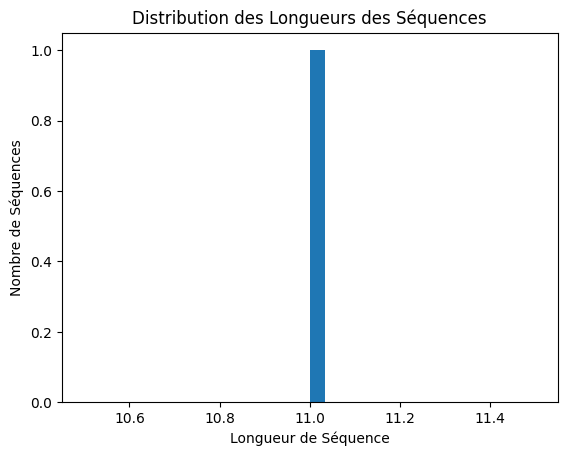

In [17]:
# Visualisation de la distribution des longueurs des séquences
import matplotlib.pyplot as plt
plt.hist(max_sequence_length, bins=30)
plt.xlabel('Longueur de Séquence')
plt.ylabel('Nombre de Séquences')
plt.title('Distribution des Longueurs des Séquences')
plt.show()


In [18]:
# Hyperparamètres et dimensions des données*
taille_num_features = scaled_df.shape[1]
taille_text_features = max_sequence_length # je donne la taille max parmi les longueur des sequences
vocab_size = 20000  
embedding_dim = 128  

In [19]:
from tensorflow.keras.layers import *
import tensorflow as tf



# Entrées
input_num = tf.keras.layers.Input(shape=(taille_num_features,))
input_text = tf.keras.layers.Input(shape=(taille_text_features,))


In [20]:
# Branches du modèle
# Branche numérique - FFN

num_branch = tf.keras.layers.Dense(128, activation='relu')(input_num)
num_branch = tf.keras.layers.Dense(64, activation='relu')(num_branch)


In [21]:

# Branche textuelle - Embedding + Transformer (Un block)

text_branch = Embedding(vocab_size, embedding_dim, input_length=taille_text_features)(input_text)

mask_inputs = masque_remplissage(input_text) 

num_blocks = 4
out_seq = text_branch  # Initialisation avec les embeddings
for _ in range(num_blocks):
    out_seq = Encodeur(
            n_layers=4,
            d_model=128,
            num_heads=8,
            middle_units=256,
            max_seq_len=taille_text_features)([text_branch, mask_inputs])
out_seq = GlobalAveragePooling1D()(out_seq)
out_seq = Dropout(0.3)(out_seq)

In [22]:
# Fusion des branches 

flattened_text_branch = tf.keras.layers.Flatten()(text_branch) # je remodelise les dimension
merged = tf.keras.layers.concatenate([num_branch, flattened_text_branch])

# merged = layers.add([num_branch, text_branch])
# merged = layers.subtract([num_branch, text_branch])
# merged = layers.multiply([num_branch, text_branch])

In [23]:
# Couches supplémentaires après la fusion
merged = tf.keras.layers.Dropout(0.3)(merged)
merged = tf.keras.layers.Dense(16, activation='relu')(merged)

output = tf.keras.layers.Dense(1, activation='sigmoid')(merged)


In [24]:
# Création et compilation du modèle
model = Model(inputs=[input_num, input_text], outputs=output)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [25]:
print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 11)]         0           []                               
                                                                                                  
 dense (Dense)                  (None, 128)          4224        ['input_1[0][0]']                
                                                                                                  
 embedding (Embedding)          (None, 11, 128)      2560000     ['input_2[0][0]']                
                                                                                              

In [26]:
from tensorflow.keras.preprocessing.sequence import pad_sequences


# Entrées pour l'entraînement
data_num = scaled_df   
data_text = pad_sequences(tokens, maxlen=max_sequence_length,padding='post')



In [29]:
# Assurez-vous que les données numériques sont correctes
print("Shape of data_num:", data_num.shape)

# Assurez-vous que les données textuelles sont correctes après le rembourrage
print("Shape of data_text:", data_text.shape)

# Assurez-vous que les étiquettes sont correctes
print("Shape of labels:", y.shape)

# NB utiliser le resultat obtenu pour modifier les tailles ou dimension de mes entrées definie plus haut


Shape of data_num: (433364, 32)
Shape of data_text: (433364, 11)
Shape of labels: (433364,)


In [30]:
from sklearn.preprocessing import MinMaxScaler, LabelEncoder


# 6. Encodage des étiquettes
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

In [31]:
print("Nombre d'échantillons dans data_num:", len(data_num))
print("Nombre d'échantillons dans data_text:", len(data_text))
print("Nombre d'échantillons dans y_encoded:", len(y_encoded))


Nombre d'échantillons dans data_num: 433364
Nombre d'échantillons dans data_text: 433364
Nombre d'échantillons dans y_encoded: 433364


In [32]:
from sklearn.model_selection import train_test_split

# 7. Diviser les données en ensembles d'entraînement et de test
X_train_numerical, X_test_numerical, X_train_categorical, X_test_categorical, y_train, y_test = train_test_split(data_num, data_text, y_encoded, test_size=0.2, random_state=42)

In [33]:
print("Shape of text_train:", X_train_categorical.shape)
print("Shape of labels_train:", y_train.shape)
print("Shape of text_test:", X_test_categorical.shape)
print("Shape of labels_test:", y_test.shape)
print("Shape of num_train:", X_train_numerical.shape)
print("Shape of num_test:", X_test_numerical.shape)



Shape of text_train: (346691, 11)
Shape of labels_train: (346691,)
Shape of text_test: (86673, 11)
Shape of labels_test: (86673,)
Shape of num_train: (346691, 32)
Shape of num_test: (86673, 32)


In [34]:
history = model.fit([X_train_numerical,X_train_categorical], y_train, epochs=10, batch_size=32, validation_data=([X_test_numerical,X_test_categorical], y_test))


Train on 346691 samples, validate on 86673 samples
Epoch 1/10
346691/346691 [==============================] - ETA: 0s - loss: 0.3567 - accuracy: 0.8487

c:\python install\lib\site-packages\keras\engine\training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


346691/346691 [==============================] - 689s 2ms/sample - loss: 0.3567 - accuracy: 0.8487 - val_loss: 0.3491 - val_accuracy: 0.8512
Epoch 2/10
346691/346691 [==============================] - 782s 2ms/sample - loss: 0.3501 - accuracy: 0.8505 - val_loss: 0.3477 - val_accuracy: 0.8515
Epoch 3/10
346691/346691 [==============================] - 742s 2ms/sample - loss: 0.3491 - accuracy: 0.8507 - val_loss: 0.3480 - val_accuracy: 0.8514
Epoch 4/10
346691/346691 [==============================] - 748s 2ms/sample - loss: 0.3485 - accuracy: 0.8507 - val_loss: 0.3481 - val_accuracy: 0.8512
Epoch 5/10
346691/346691 [==============================] - 739s 2ms/sample - loss: 0.3481 - accuracy: 0.8508 - val_loss: 0.3479 - val_accuracy: 0.8517
Epoch 6/10
346691/346691 [==============================] - 689s 2ms/sample - loss: 0.3478 - accuracy: 0.8508 - val_loss: 0.3474 - val_accuracy: 0.8515
Epoch 7/10
346691/346691 [==============================] - 758s 2ms/sample - loss: 0.3475 - accura

In [24]:
#on effectue les prediction sur les donnees de test

y_pred = model.predict([X_test_numerical,X_test_categorical])

print(y_pred)

c:\python install\lib\site-packages\keras\engine\training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[[0.1115004 ]
 [0.20479603]
 [0.2211111 ]
 ...
 [0.99692035]
 [0.10574228]
 [0.20582108]]


In [25]:
# necessaire pour afficher la matrix de confusion car a besoin que la probabilité retourner pqr lq fonction sigmoid soir saoit 0 ou 1 pour travailler dessus

y_pred = np.round(y_pred)

In [26]:
# Évaluation du modèle sur les données de test
evaluation_results = model.evaluate([X_test_numerical, X_test_categorical], y_test)
# loss, accuracy = model.evaluate([num_test, text_test], y_pred)


# Affichage des résultats

# print(f'Accuracy: {accuracy}, Loss: {loss}')
print("Perte sur les données de test:", evaluation_results[0])
print("Précision sur les données de test:", evaluation_results[1])


Perte sur les données de test: 0.3288003708236489
Précision sur les données de test: 0.8738823


In [27]:
from sklearn.metrics import classification_report


# Afficher le rapport de classification
class_report = classification_report(y_test, y_pred)
print("Rapport de classification :\n", class_report)


Rapport de classification :
               precision    recall  f1-score   support

           0       0.82      1.00      0.90     50399
           1       0.99      0.70      0.82     36274

    accuracy                           0.87     86673
   macro avg       0.91      0.85      0.86     86673
weighted avg       0.90      0.87      0.87     86673



In [28]:
# Extraction des métriques d'entraînement
loss = history.history['loss']
accuracy = history.history['accuracy']
val_loss = history.history['val_loss']
val_accuracy = history.history['val_accuracy']

# Affichage des courbes de perte et d'exactitude séparément
epochs = range(1, len(loss) + 1)

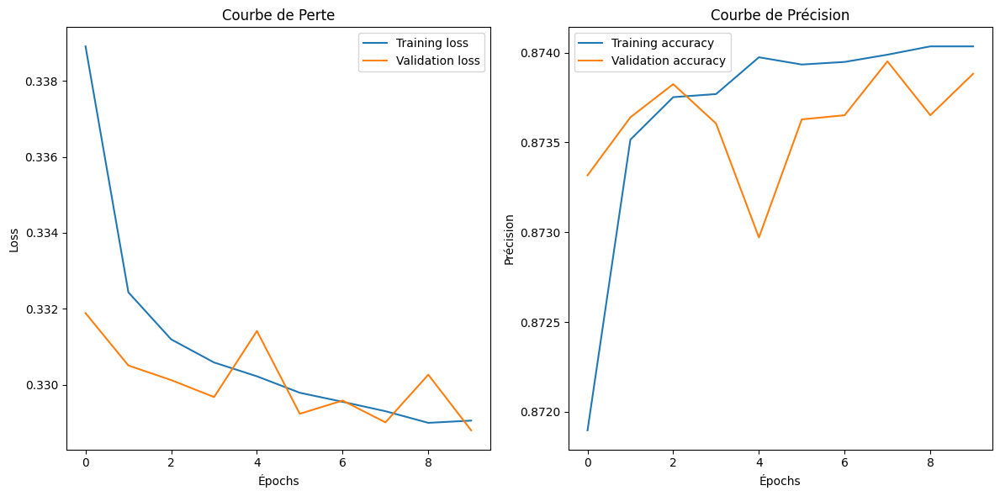

In [29]:
# Affichage des courbes d'apprentissage et de validation
plt.figure(figsize=(12, 6))

# Plot de la perte d'entraînement et de la perte de validation
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.title('Courbe de Perte')
plt.xlabel('Épochs')
plt.ylabel('Loss')
plt.legend()


# Plot de la précision d'entraînement et de la précision de validation
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training accuracy')
plt.plot(history.history['val_accuracy'], label='Validation accuracy')
plt.title('Courbe de Précision')
plt.xlabel('Épochs')
plt.ylabel('Précision')
plt.legend()

# Afficher les deux sous-plots
plt.tight_layout()
plt.show()

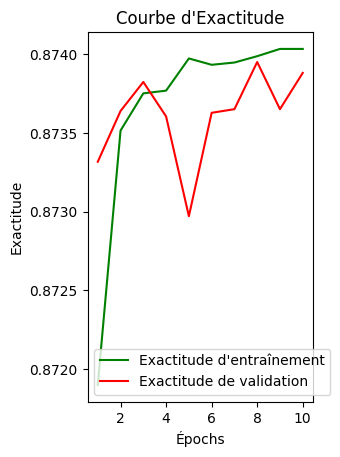

In [30]:
# Courbe d'exactitude
plt.subplot(1, 2, 2)
plt.plot(epochs, accuracy, 'g', label='Exactitude d\'entraînement')
plt.plot(epochs, val_accuracy, 'r', label='Exactitude de validation')
plt.title('Courbe d\'Exactitude')
plt.xlabel('Épochs')
plt.ylabel('Exactitude')
plt.legend()

plt.show()

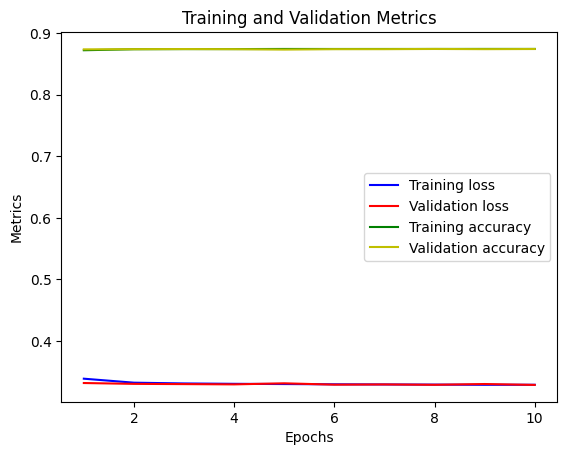

In [31]:
# je use une courbe pour afficher tout les 4 courbes

# Afficher les courbes
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.plot(epochs, accuracy, 'g', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'y', label='Validation accuracy')
plt.title('Training and Validation Metrics')
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.show()

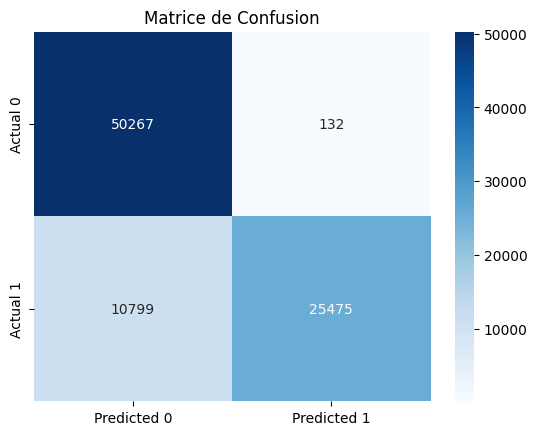

In [32]:
#affichage de la matrixe de confusion

import seaborn as sn
import pandas as pd
from sklearn.metrics import confusion_matrix


#calul preliminaire pour obtenir la matrice de confusion

conf_matrix = confusion_matrix(y_test,y_pred)
true_negatives, false_positives,false_negatives, true_positives = conf_matrix.ravel()

# Créer la matrice de confusion
conf_matrix = np.array([[true_negatives, false_positives], [false_negatives, true_positives]])

# Afficher la matrice de confusion avec seaborn
df_cm = pd.DataFrame(conf_matrix, index=['Actual 0', 'Actual 1'], columns=['Predicted 0', 'Predicted 1'])
sn.heatmap(df_cm, annot=True, cmap='Blues', fmt='g')
plt.title('Matrice de Confusion')
plt.show()


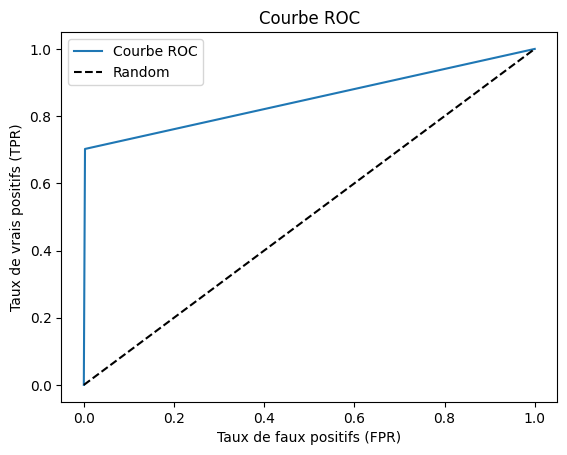

NameError: name 'labels_test' is not defined

In [33]:
#Courbe de ROC

from sklearn.metrics import roc_curve, roc_auc_score

# Calcul des taux FPR et TPR
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

# Plotter la courbe ROC
plt.plot(fpr, tpr, label='Courbe ROC')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbe ROC')
plt.legend()
plt.show()

# Calcul de l'AUC
auc = roc_auc_score(labels_test, y_pred)
print('Aire sous la courbe (AUC) :', auc)
